# HEAT MAPS

Here we plot grid significance data as heat maps to see spatio-temporal patterns from the fossil occurrence data.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors
import geopandas
world = geopandas.read_file('../geopandas/world_m.shp')
# coordinate reference system = epsg 4326, 
# tells how coordinates translate to points on the map
world = world.to_crs(epsg=4326)

localityFeatures = pd.read_csv('../csv/localityFeatures500.csv', index_col=0)
timeUnits = ['old','MN1','MN2','MN3','MN4','MN5','MN6','MN7-8','MN9','MN10','MN11','MN12','MN13','MN14','MN15','MN16','MN17','MQ18','MQ19','recent']

pd.set_option('max_columns',100)

In [2]:
localityFeatures.shape[0]

2822

In [3]:
# import grid data

gridFeaturesAll = []
for timeUnit in timeUnits[1:19]:
    filename = '../csv/gridFeatures500/gridFeatures_' + timeUnit + '.csv'
    gridFeatures = pd.read_csv(filename, index_col=0)
    gridFeaturesAll.append(gridFeatures)

# SIGNIFICANCE

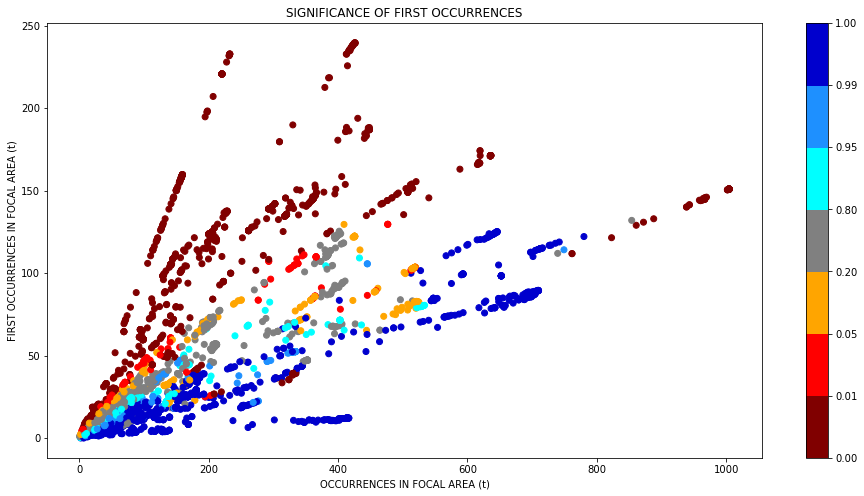

In [4]:
#cmap = 'RdYlBu'
#norm = matplotlib.colors.Normalize(vmin=0, vmax=1)

cmap = matplotlib.colors.ListedColormap(['maroon','red','orange','gray','cyan','dodgerblue','mediumblue'])
norm = matplotlib.colors.BoundaryNorm([0,0.01,0.05,0.2,0.8,0.95,0.99,1],8)

fig, ax = plt.subplots(figsize=(16,8))
color = localityFeatures['SIGNIFICANCE FIRST']
plt.scatter(localityFeatures['OCCURRENCES IN FOCAL AREA (t)'], \
            localityFeatures['FIRST OCCURRENCES IN FOCAL AREA (t)'], c=color, cmap=cmap, norm=norm)
plt.colorbar()
plt.xlabel('OCCURRENCES IN FOCAL AREA (t)')
plt.ylabel('FIRST OCCURRENCES IN FOCAL AREA (t)')
plt.title('SIGNIFICANCE OF FIRST OCCURRENCES')
plt.show()

In [5]:
# define timeunit as a categorical variable with given order (used in the following cells)
localityFeatures['TIMEUNIT'] = pd.Categorical(localityFeatures['TIMEUNIT'], categories=timeUnits, ordered=True)
# use only localities within timeunits MN2 to MQ18
plottingLocalities = localityFeatures[(localityFeatures['TIMEUNIT']>'MN1') & (localityFeatures['TIMEUNIT']<'MQ19')]

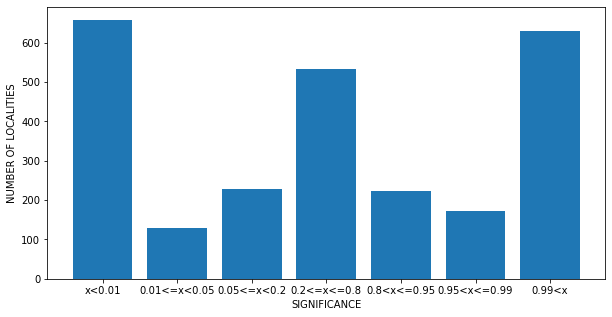

In [6]:
# SPATIAL AGGREGATION OF OCCURRENCES PRODUCES LARGER SAMPLE SIZES, WHICH INCREASES THE SIGNIFICANCE OF SMALL EFFECTS

x = np.arange(0,7)
y = np.array([0,0,0,0,0,0,0])    
y[0] = plottingLocalities[plottingLocalities['SIGNIFICANCE FIRST']<0.01].shape[0]
y[1] = plottingLocalities[(plottingLocalities['SIGNIFICANCE FIRST']>=0.01) & \
                        (plottingLocalities['SIGNIFICANCE FIRST']<0.05)].shape[0]
y[2] = plottingLocalities[(plottingLocalities['SIGNIFICANCE FIRST']>=0.05) & \
                        (plottingLocalities['SIGNIFICANCE FIRST']<0.2)].shape[0]
y[3] = plottingLocalities[(plottingLocalities['SIGNIFICANCE FIRST']>=0.2) & \
                        (plottingLocalities['SIGNIFICANCE FIRST']<=0.8)].shape[0]
y[4] = plottingLocalities[(plottingLocalities['SIGNIFICANCE FIRST']>0.8) & \
                        (plottingLocalities['SIGNIFICANCE FIRST']<=0.95)].shape[0]
y[5] = plottingLocalities[(plottingLocalities['SIGNIFICANCE FIRST']>0.95) & \
                        (plottingLocalities['SIGNIFICANCE FIRST']<=0.99)].shape[0]
y[6] = plottingLocalities[(plottingLocalities['SIGNIFICANCE FIRST']>0.99)].shape[0]

fig, ax = plt.subplots(figsize=(10,5))
plt.bar(x,y,width=0.8)
ax.set_xticks(x)
ax.set_xticklabels(['x<0.01','0.01<=x<0.05','0.05<=x<0.2','0.2<=x<=0.8','0.8<x<=0.95','0.95<x<=0.99','0.99<x'])
plt.xlabel('SIGNIFICANCE')
plt.ylabel('NUMBER OF LOCALITIES')

#filepath = '../figures/localitySignificances500.eps'
#plt.savefig(filepath, bbox_inches='tight')

plt.show()

# OCCURRENCES

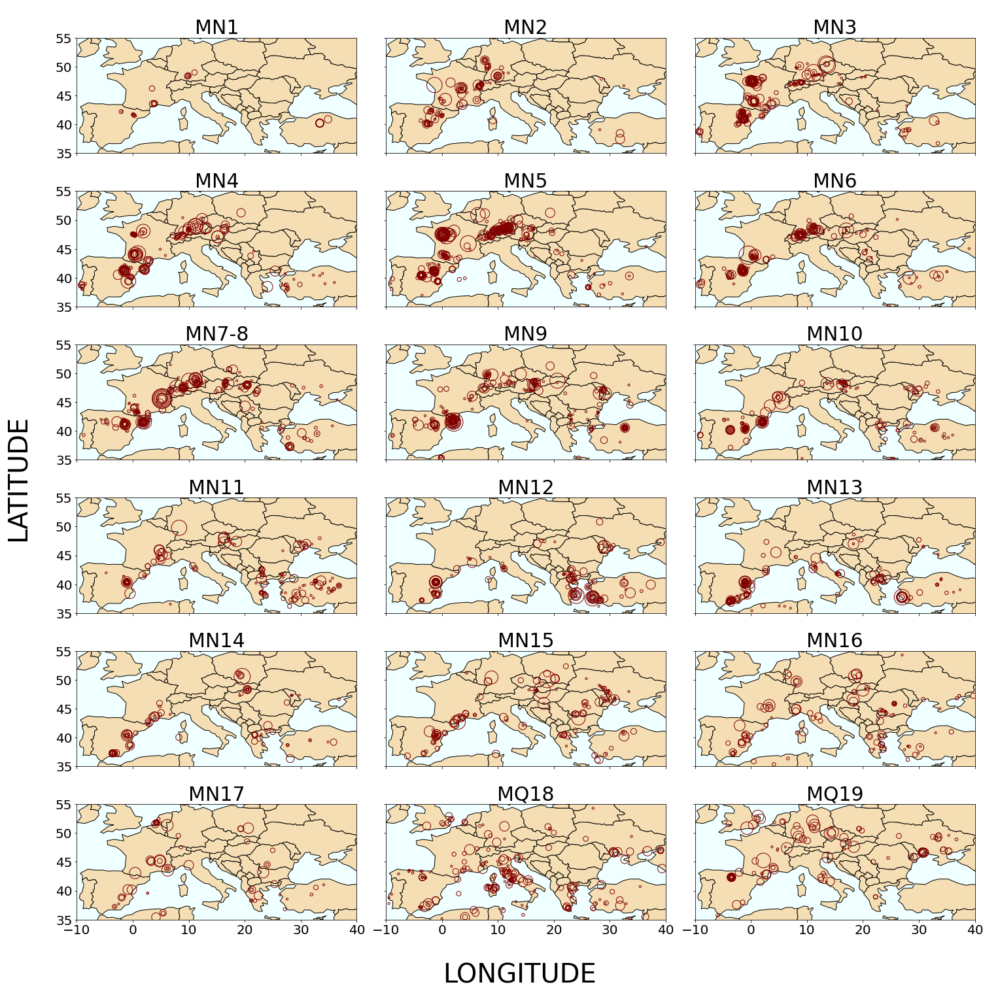

In [7]:
# LOCALITY OCCURRENCES

myMap = world.cx[:,:]
fig, axs = plt.subplots(6, 3, sharex=True, sharey=True, figsize=(20,20))

timeCount = 1
xCount = 0
yCount = 0
for gridFeatures in gridFeaturesAll:
    #plot map    
    myMap.plot(ax=axs[yCount,xCount], color='wheat', edgecolor='black')
    
    x = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LONG']
    y = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LAT']
    size = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]),'NUMBER OF OCCURRENCES']
    axs[yCount,xCount].scatter(x, y, marker='o', s=10*size, facecolors='none',  edgecolors='maroon')
    
    axs[yCount,xCount].set_title(timeUnits[timeCount], fontsize=30)
    axs[yCount,xCount].set_xlim((-10,40))
    axs[yCount,xCount].set_ylim((35,55))
    axs[yCount,xCount].tick_params(labelsize=20)
    
    axs[yCount,xCount].set_facecolor('azure')
    
    timeCount += 1
    xCount += 1
    if xCount%3 == 0:
        xCount = 0
        yCount += 1

plt.tight_layout()

ax2 = fig.add_axes([0, 0, 1, 1], frameon=False)
ax2.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
ax2.set_xlabel('LONGITUDE', fontsize=40)
ax2.set_ylabel('LATITUDE', fontsize=40)

#filepath = '../figures/sampling_circles.eps'
#plt.savefig(filepath, bbox_inches='tight')

plt.show()

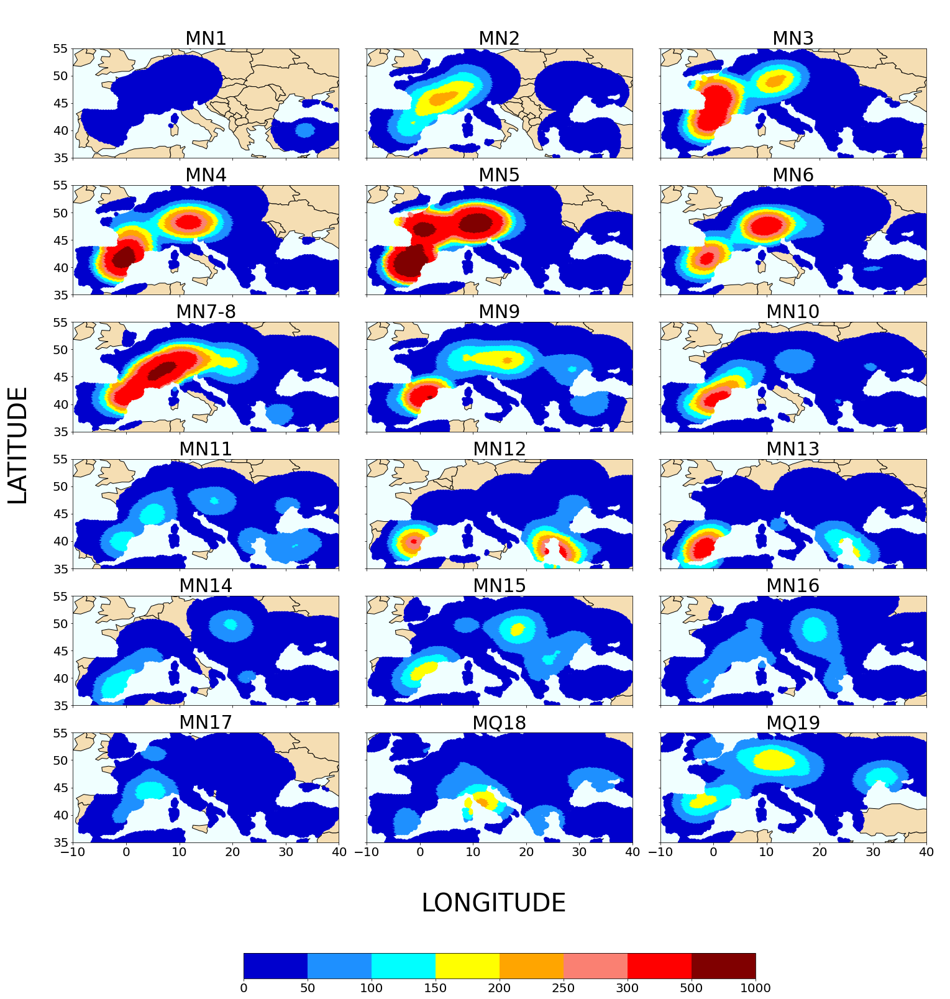

In [8]:
# GRID OCCURRENCES

myMap = world.cx[:,:]
fig, axs = plt.subplots(6, 3, sharex=True, sharey=True, figsize=(20,25))

#cmap = 'RdYlBu_r'
#norm = matplotlib.colors.Normalize(vmin=0, vmax=400)
#cmap = matplotlib.colors.ListedColormap(['maroon','red','orange','gray','cyan','dodgerblue','mediumblue'])
cmap = matplotlib.colors.ListedColormap(['mediumblue','dodgerblue','cyan','yellow','orange','salmon','red','maroon',])
norm = matplotlib.colors.BoundaryNorm([0,50,100,150,200,250,300,500,1000],9)

timeCount = 1
xCount = 0
yCount = 0
for gridFeatures in gridFeaturesAll:
    #plot map    
    myMap.plot(ax=axs[yCount,xCount], color='wheat', edgecolor='black')
    
    x = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>0, 'LONG']
    y = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>0, 'LAT']
    color = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>0, 'OCCURRENCES IN FOCAL AREA (t)']
    axs[yCount,xCount].scatter(x, y, marker='o', c=color, cmap=cmap, norm=norm)
    
    axs[yCount,xCount].set_title(timeUnits[timeCount], fontsize=30)
    axs[yCount,xCount].set_xlim((-10,40))
    axs[yCount,xCount].set_ylim((35,55))
    axs[yCount,xCount].tick_params(labelsize=20)
    
    axs[yCount,xCount].set_facecolor('azure')
    
    timeCount += 1
    xCount += 1
    if xCount%3 == 0:
        xCount = 0
        yCount += 1

plt.tight_layout()

cbar = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=axs, shrink=0.6, \
                    orientation='horizontal', pad=0.1)    
cbar.ax.tick_params(labelsize=20)

ax2 = fig.add_axes([0, 0.22, 1, 0.78], frameon=False)
ax2.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
ax2.set_xlabel('LONGITUDE', fontsize=40)
ax2.set_ylabel('LATITUDE', fontsize=40)

#filepath = '../figures/sampling.eps'
#plt.savefig(filepath, bbox_inches='tight')

plt.show()

# SPECIATION

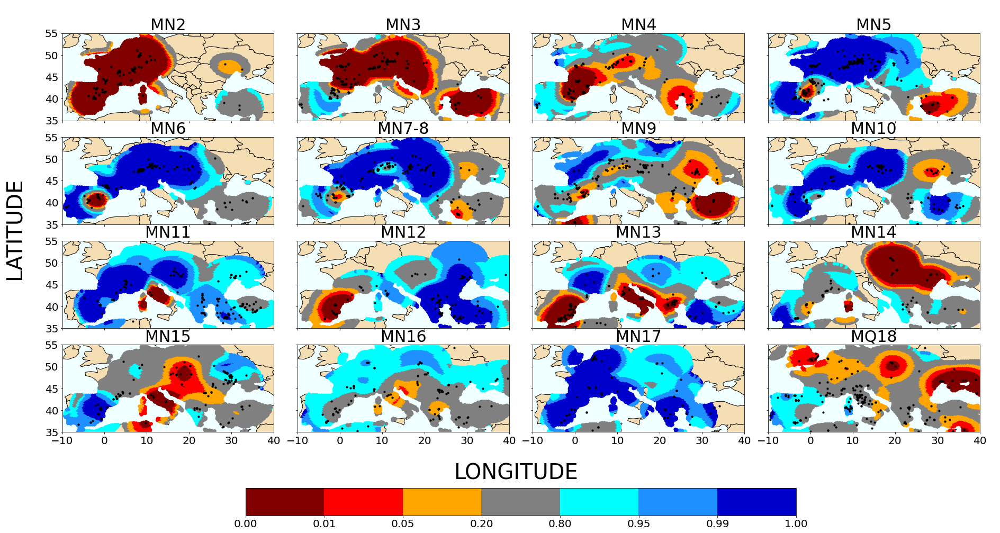

In [37]:
# SPECIATION HEAT MAPS, CUSTOM HIGHLIGHTING

min_occurrences = 1

myMap = world.cx[:,:]
cmap = matplotlib.colors.ListedColormap(['maroon','red','orange','gray','cyan','dodgerblue','mediumblue'])
norm = matplotlib.colors.BoundaryNorm([0,0.01,0.05,0.2,0.8,0.95,0.99,1],8)
fig, axs = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(25,15))

timeCount = 2
xCount = 0
yCount = 0
for gridFeatures in gridFeaturesAll[1:-1]:
    #plot map    
    myMap.plot(ax=axs[yCount,xCount], color='wheat', edgecolor='black')
    
    x = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences,'LONG']
    y = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences,'LAT']        
    color = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences,'SIGNIFICANCE FIRST']
    map_set = axs[yCount,xCount].scatter(x, y, c=color, cmap=cmap, norm=norm)
    
    x = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LONG']
    y = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LAT']
    size = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]),'NUMBER OF OCCURRENCES']
    axs[yCount,xCount].scatter(x, y, c='black', marker='o', s=10)
    #axs[yCount,xCount].scatter(x, y, marker='o', s=10*size, facecolors='none',  edgecolors='black')
    
    axs[yCount,xCount].set_title(timeUnits[timeCount], fontsize=30)
    axs[yCount,xCount].set_xlim((-10,40))
    axs[yCount,xCount].set_ylim((35,55))
    axs[yCount,xCount].tick_params(labelsize=20)
    
    axs[yCount,xCount].set_facecolor('azure')
    
    timeCount += 1
    xCount += 1
    if xCount%4 == 0:
        xCount = 0
        yCount += 1

plt.tight_layout()
    
cbar = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=axs, shrink=0.6, \
                    orientation='horizontal', pad=0.1) 
cbar.ax.tick_params(labelsize=20)

ax2 = fig.add_axes([0, 0.22, 1, 0.78], frameon=False)
ax2.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
ax2.set_xlabel('LONGITUDE', fontsize=40)
ax2.set_ylabel('LATITUDE', fontsize=40)

#filepath = '../figures/speciation500.eps'
#plt.savefig(filepath, bbox_inches='tight')

plt.show()

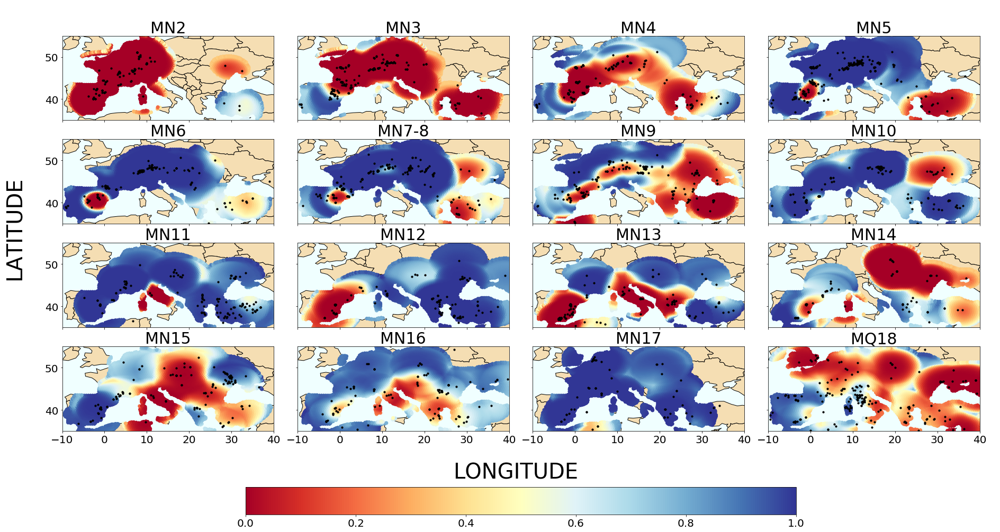

In [11]:
# SPECIATION HEAT MAPS, NORMALIZED WITH SLIDING SCALE

min_occurrences = 1

myMap = world.cx[:,:]
#cmap = matplotlib.colors.ListedColormap(['maroon','red','orange','gray','cyan','dodgerblue','mediumblue'])
#norm = matplotlib.colors.BoundaryNorm([0,0.01,0.05,0.2,0.8,0.95,0.99,1],8)
cmap = 'RdYlBu'
#norm = None
norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
fig, axs = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(25,15))

timeCount = 2
xCount = 0
yCount = 0
for gridFeatures in gridFeaturesAll[1:-1]:
    #plot map    
    myMap.plot(ax=axs[yCount,xCount], color='wheat', edgecolor='black')
    
    x = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences,'LONG']
    y = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences,'LAT']        
    color = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences,'SIGNIFICANCE FIRST']
    map_set = axs[yCount,xCount].scatter(x, y, c=color, cmap=cmap, norm=norm)
    
    x = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LONG']
    y = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LAT']
    size = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]),'NUMBER OF OCCURRENCES']
    axs[yCount,xCount].scatter(x, y, c='black', marker='o', s=10)
    #axs[yCount,xCount].scatter(x, y, marker='o', s=10*size, facecolors='none',  edgecolors='black')
    
    axs[yCount,xCount].set_title(timeUnits[timeCount], fontsize=30)
    axs[yCount,xCount].set_xlim((-10,40))
    axs[yCount,xCount].set_ylim((35,55))
    axs[yCount,xCount].tick_params(labelsize=20)
    
    axs[yCount,xCount].set_facecolor('azure')
    
    timeCount += 1
    xCount += 1
    if xCount%4 == 0:
        xCount = 0
        yCount += 1

plt.tight_layout()
    
cbar = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=axs, shrink=0.6, \
                    orientation='horizontal', pad=0.1) 
cbar.ax.tick_params(labelsize=20)

ax2 = fig.add_axes([0, 0.22, 1, 0.78], frameon=False)
ax2.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
ax2.set_xlabel('LONGITUDE', fontsize=40)
ax2.set_ylabel('LATITUDE', fontsize=40)

#filepath = '../figures/speciation500_sliding_normalized.eps'
#plt.savefig(filepath, bbox_inches='tight')

plt.show()

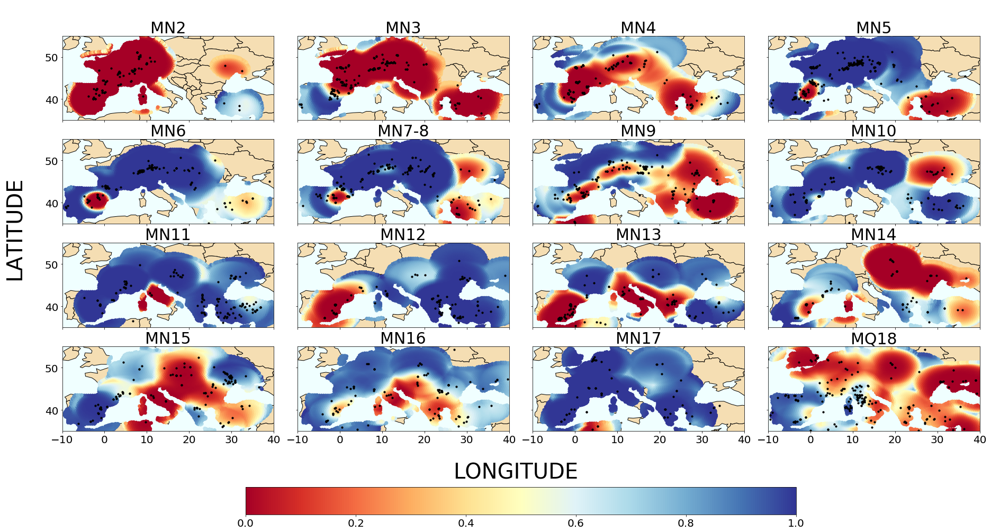

In [12]:
# SPECIATION HEAT MAPS, NON-NORMALIZED WITH SLIDING SCALE
# FOR EACH TIME UNIT, A SEPARATE COLORING SO THAT MINIMUM ALWAYS RED (EVEN IF MINIMUM NOT CLOSE TO ZERO)

min_occurrences = 1

myMap = world.cx[:,:]
#cmap = matplotlib.colors.ListedColormap(['maroon','red','orange','gray','cyan','dodgerblue','mediumblue'])
#norm = matplotlib.colors.BoundaryNorm([0,0.01,0.05,0.2,0.8,0.95,0.99,1],8)
cmap = 'RdYlBu'
norm = None
#norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
fig, axs = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(25,15))

timeCount = 2
xCount = 0
yCount = 0
for gridFeatures in gridFeaturesAll[1:-1]:
    #plot map    
    myMap.plot(ax=axs[yCount,xCount], color='wheat', edgecolor='black')
    
    x = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences,'LONG']
    y = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences,'LAT']        
    color = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences,'SIGNIFICANCE FIRST']
    map_set = axs[yCount,xCount].scatter(x, y, c=color, cmap=cmap, norm=norm)
    
    x = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LONG']
    y = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LAT']
    size = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]),'NUMBER OF OCCURRENCES']
    axs[yCount,xCount].scatter(x, y, c='black', marker='o', s=10)
    #axs[yCount,xCount].scatter(x, y, marker='o', s=10*size, facecolors='none',  edgecolors='black')
    
    axs[yCount,xCount].set_title(timeUnits[timeCount], fontsize=30)
    axs[yCount,xCount].set_xlim((-10,40))
    axs[yCount,xCount].set_ylim((35,55))
    axs[yCount,xCount].tick_params(labelsize=20)
    
    axs[yCount,xCount].set_facecolor('azure')
    
    timeCount += 1
    xCount += 1
    if xCount%4 == 0:
        xCount = 0
        yCount += 1

plt.tight_layout()
    
cbar = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=axs, shrink=0.6, \
                    orientation='horizontal', pad=0.1) 
cbar.ax.tick_params(labelsize=20)

ax2 = fig.add_axes([0, 0.22, 1, 0.78], frameon=False)
ax2.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
ax2.set_xlabel('LONGITUDE', fontsize=40)
ax2.set_ylabel('LATITUDE', fontsize=40)

#filepath = '../figures/speciation500_sliding.eps'
#plt.savefig(filepath, bbox_inches='tight')

plt.show()

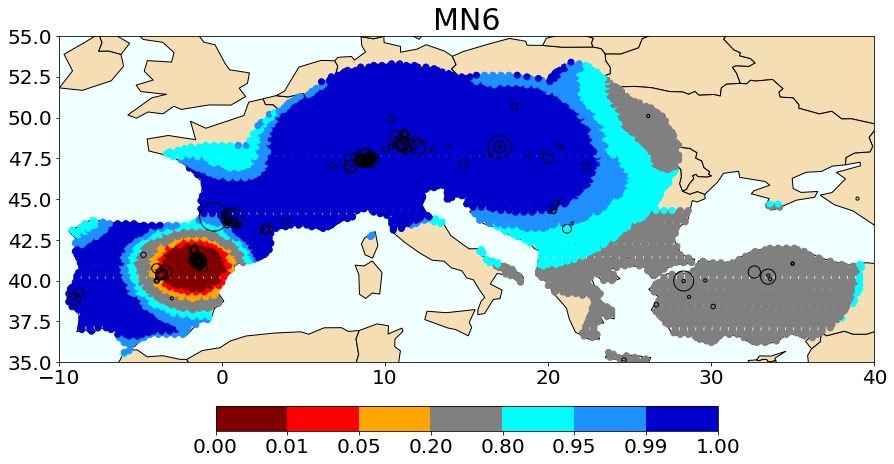

In [17]:
# SPECIATION HEAT MAP FOR ONE TIME UNIT

timeUnit = 'MN6'
min_occurrences = 1

myMap = world.cx[:,:]
cmap = matplotlib.colors.ListedColormap(['maroon','red','orange','gray','cyan','dodgerblue','mediumblue'])
norm = matplotlib.colors.BoundaryNorm([0,0.01,0.05,0.2,0.8,0.95,0.99,1],8)
fig, ax = plt.subplots(figsize=(15,8))

timeUnitIndex = timeUnits.index(timeUnit)
gridFeatures = gridFeaturesAll[timeUnitIndex-1]

#plot map    
myMap.plot(ax=ax, color='wheat', edgecolor='black')

x = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences,'LONG']
y = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences,'LAT']        
color = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences,'SIGNIFICANCE FIRST']
map_set = ax.scatter(x, y, c=color, cmap=cmap, norm=norm)

x = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnit), 'LONG']
y = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnit), 'LAT']
size = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnit),'NUMBER OF OCCURRENCES']
#axs[yCount,xCount].scatter(x, y, c='black', marker='o', s=10)
plt.scatter(x, y, marker='o', s=10*size, facecolors='none',  edgecolors='black')

ax.set_title(timeUnit, fontsize=30)
ax.set_xlim((-10,40))
ax.set_ylim((35,55))
ax.tick_params(labelsize=20)

ax.set_facecolor('azure')
    
cbar = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, shrink=0.6, \
                    orientation='horizontal', pad=0.1) 
cbar.ax.tick_params(labelsize=20)

plt.show()

# EXTINCTION

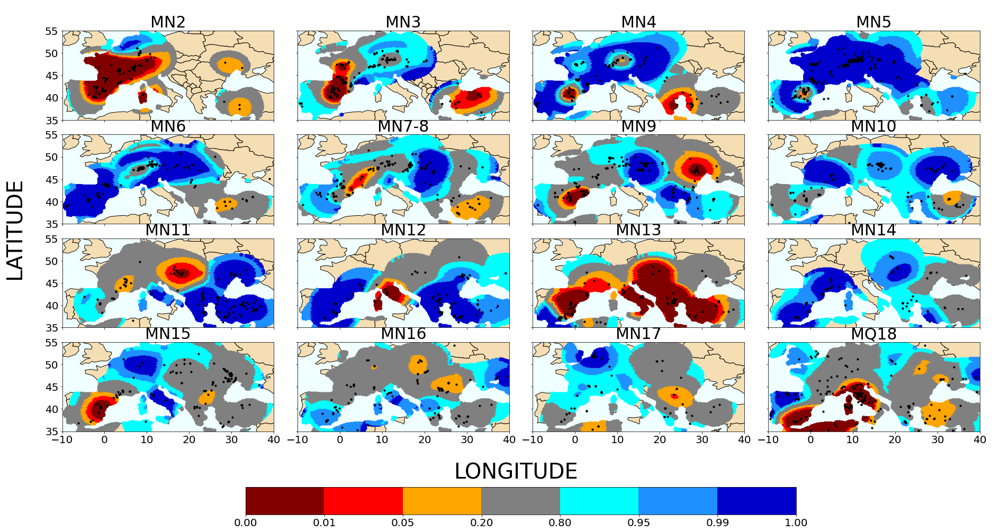

In [38]:
# EXTINCTION MAPS

min_occurrences = 1

myMap = world.cx[-25:,:]
cmap = matplotlib.colors.ListedColormap(['maroon','red','orange','gray','cyan','dodgerblue','mediumblue'])
norm = matplotlib.colors.BoundaryNorm([0,0.01,0.05,0.2,0.8,0.95,0.99,1],8)
fig, axs = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(25,15))

timeCount = 2
xCount = 0
yCount = 0
for gridFeatures in gridFeaturesAll[1:-1]:
    #plot map    
    myMap.plot(ax=axs[yCount,xCount], color='wheat', edgecolor='black')
    
    x = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences,'LONG']
    y = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences,'LAT']        
    color = gridFeatures.loc[gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences,'SIGNIFICANCE LAST']
    map_set = axs[yCount,xCount].scatter(x, y, c=color, cmap=cmap, norm=norm)
    
    x = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LONG']
    y = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LAT']
    axs[yCount,xCount].scatter(x, y, c='black', marker='o', s=10)
    #axs[yCount,xCount].scatter(x, y, marker='o', s=10*size, facecolors='none',  edgecolors='black')
    
    axs[yCount,xCount].set_title(timeUnits[timeCount], fontsize=30)
    axs[yCount,xCount].set_xlim((-10,40))
    axs[yCount,xCount].set_ylim((35,55))
    axs[yCount,xCount].tick_params(labelsize=20)
    
    axs[yCount,xCount].set_facecolor('azure')
    
    timeCount += 1
    xCount += 1
    if xCount%4 == 0:
        xCount = 0
        yCount += 1
        
plt.tight_layout()
    
cbar = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=axs, shrink=0.6, \
                    orientation='horizontal', pad=0.1) 
cbar.ax.tick_params(labelsize=20)

ax2 = fig.add_axes([0, 0.22, 1, 0.78], frameon=False)
ax2.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
ax2.set_xlabel('LONGITUDE', fontsize=40)
ax2.set_ylabel('LATITUDE', fontsize=40)

#filepath = '../figures/extinction500.eps'
#plt.savefig(filepath, bbox_inches='tight')

plt.show()

# SPECIATION + EXTINCTION

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


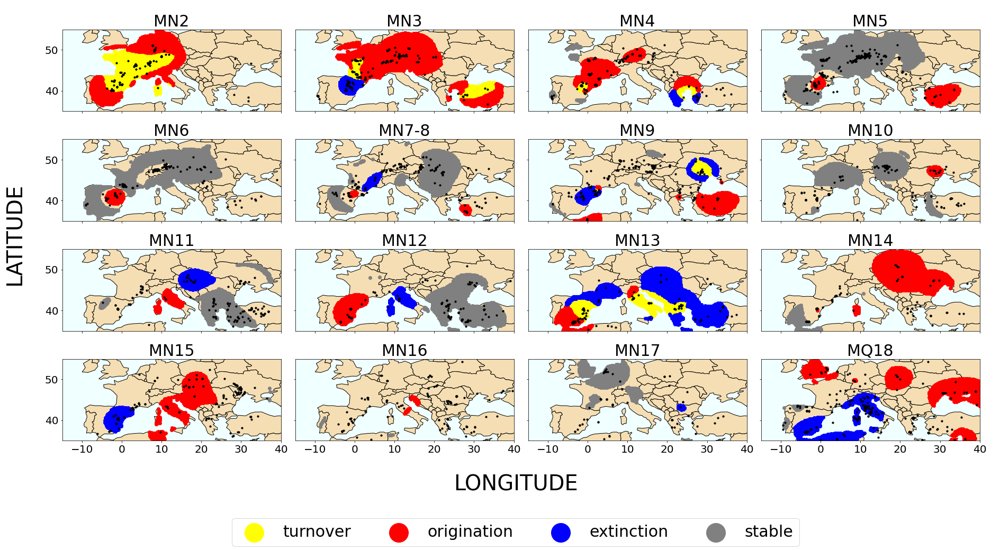

In [29]:
# BIODIVERSITY HOTSPOTS

min_occurrences = 1

myMap = world.cx[:,:]
fig, axs = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(25,12))

timeCount = 2
xCount = 0
yCount = 0
for gridFeatures in gridFeaturesAll[1:-1]:
    myMap.plot(ax=axs[yCount,xCount], color='wheat', edgecolor='black')
    
    x = gridFeatures.loc[(gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences) & \
                         (gridFeatures['SIGNIFICANCE FIRST']<0.05) & (gridFeatures['SIGNIFICANCE LAST']<0.05),'LONG']
    y = gridFeatures.loc[(gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences) & \
                         (gridFeatures['SIGNIFICANCE FIRST']<0.05) & (gridFeatures['SIGNIFICANCE LAST']<0.05),'LAT']      
    axs[yCount,xCount].scatter(x, y, c='yellow', label='turnover')
    
    x = gridFeatures.loc[(gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences) & \
                         (gridFeatures['SIGNIFICANCE FIRST']<0.05) & (gridFeatures['SIGNIFICANCE LAST']>=0.05),'LONG']
    y = gridFeatures.loc[(gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences) & \
                         (gridFeatures['SIGNIFICANCE FIRST']<0.05) & (gridFeatures['SIGNIFICANCE LAST']>=0.05),'LAT']      
    axs[yCount,xCount].scatter(x, y, c='red', label='origination')
    
    x = gridFeatures.loc[(gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences) & \
                         (gridFeatures['SIGNIFICANCE FIRST']>=0.05) & (gridFeatures['SIGNIFICANCE LAST']<0.05),'LONG']
    y = gridFeatures.loc[(gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences) & \
                         (gridFeatures['SIGNIFICANCE FIRST']>=0.05) & (gridFeatures['SIGNIFICANCE LAST']<0.05),'LAT']      
    axs[yCount,xCount].scatter(x, y, c='blue', label='extinction')
    
    x = gridFeatures.loc[(gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences) & \
                         (gridFeatures['SIGNIFICANCE FIRST']>0.95) & (gridFeatures['SIGNIFICANCE LAST']>0.95),'LONG']
    y = gridFeatures.loc[(gridFeatures['OCCURRENCES IN FOCAL AREA (t)']>min_occurrences) & \
                         (gridFeatures['SIGNIFICANCE FIRST']>0.95) & (gridFeatures['SIGNIFICANCE LAST']>0.95),'LAT']      
    axs[yCount,xCount].scatter(x, y, c='gray', label='stable')
        
    axs[yCount,xCount].set_title(timeUnits[timeCount], fontsize=30)
    axs[yCount,xCount].set_xlim((-15,40))
    axs[yCount,xCount].set_ylim((35,55))
    axs[yCount,xCount].tick_params(labelsize=20)
    
    x = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LONG']
    y = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LAT']
    axs[yCount,xCount].scatter(x, y, c='black', marker='o', s=10)
    
    axs[yCount,xCount].set_facecolor('azure')
    handles, labels = axs[yCount,xCount].get_legend_handles_labels()
    
    timeCount += 1
    xCount += 1
    if xCount%4 == 0:
        xCount = 0
        yCount += 1
        
plt.tight_layout()
fig.legend(handles, labels, loc='lower center', fontsize=30, ncol=4, bbox_to_anchor=(0., -0.2, 1, 1), markerscale=6)

ax2 = fig.add_axes([0, 0, 1, 1], frameon=False)
ax2.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
ax2.set_xlabel('LONGITUDE', fontsize=40)
ax2.set_ylabel('LATITUDE', fontsize=40)

#filepath = '../figures/diversity500.eps'
#plt.savefig(filepath, bbox_inches='tight')

plt.show()

# MIGRATION

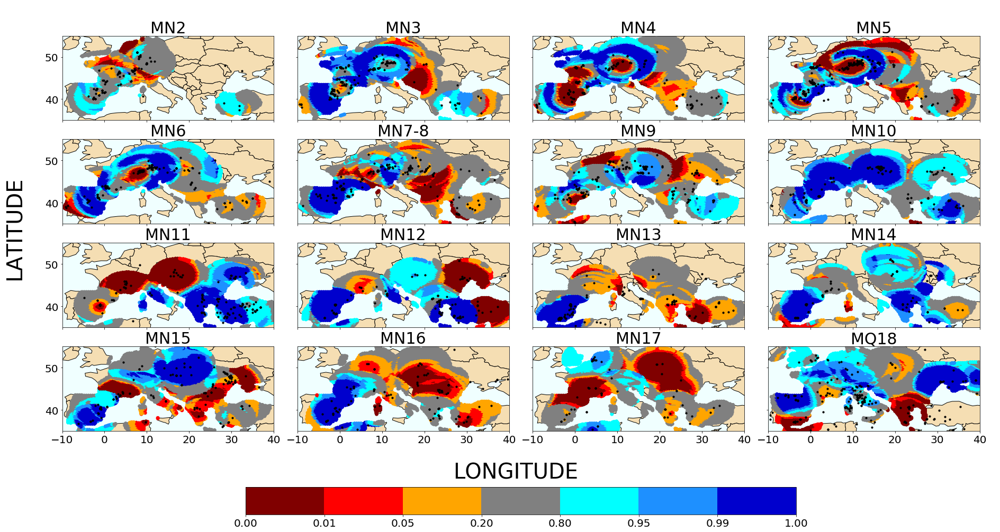

In [7]:
# EMIGRATION HEAT MAPS 
# SHOWS AREAS WHERE EXISTING SPECIES ARE MOVING OUT (ARE NOT THERE ANYMORE IN THE FOLLOWING TIME UNIT)

min_occurrences = 1
        
myMap = world.cx[:,:]
cmap = matplotlib.colors.ListedColormap(['maroon','red','orange','gray','cyan','dodgerblue','mediumblue'])
norm = matplotlib.colors.BoundaryNorm([0,0.01,0.05,0.2,0.8,0.95,0.99,1],8)
fig, axs = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(25,15))    
    
timeCount = 2
xCount = 0
yCount = 0
for i in range(1,len(gridFeaturesAll)-1):
    #plot map    
    myMap.plot(ax=axs[yCount,xCount], color='wheat', edgecolor='black')
    
    x = gridFeaturesAll[i].loc[(gridFeaturesAll[i+1]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
                         (gridFeaturesAll[i]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences),'LONG']
    y = gridFeaturesAll[i].loc[(gridFeaturesAll[i+1]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
                         (gridFeaturesAll[i]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences),'LAT']
    color=gridFeaturesAll[i+1].loc[(gridFeaturesAll[i+1]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
         (gridFeaturesAll[i]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences),'SIGNIFICANCE EMIGRATION']
    
    map_set = axs[yCount,xCount].scatter(x, y, c=color, cmap=cmap, norm=norm)
    
    x = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LONG']
    y = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LAT']
    #size = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]),'NUMBER OF OCCURRENCES']
    axs[yCount,xCount].scatter(x, y, c='black', marker='o', s=10)
    #axs[yCount,xCount].scatter(x, y, marker='o', s=10*size, facecolors='none',  edgecolors='black')
    
    axs[yCount,xCount].set_title(timeUnits[timeCount], fontsize=30)
    axs[yCount,xCount].set_xlim((-10,40))
    axs[yCount,xCount].set_ylim((35,55))
    axs[yCount,xCount].tick_params(labelsize=20)
    
    axs[yCount,xCount].set_facecolor('azure')
    
    timeCount += 1
    xCount += 1
    if xCount%4 == 0:
        xCount = 0
        yCount += 1

plt.tight_layout()
    
cbar = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=axs, shrink=0.6, \
                    orientation='horizontal', pad=0.1) 
cbar.ax.tick_params(labelsize=20)

ax2 = fig.add_axes([0, 0.22, 1, 0.78], frameon=False)
ax2.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
ax2.set_xlabel('LONGITUDE', fontsize=40)
ax2.set_ylabel('LATITUDE', fontsize=40)

#filepath = '../figures/emigration500.eps'
#plt.savefig(filepath, bbox_inches='tight')

plt.show()

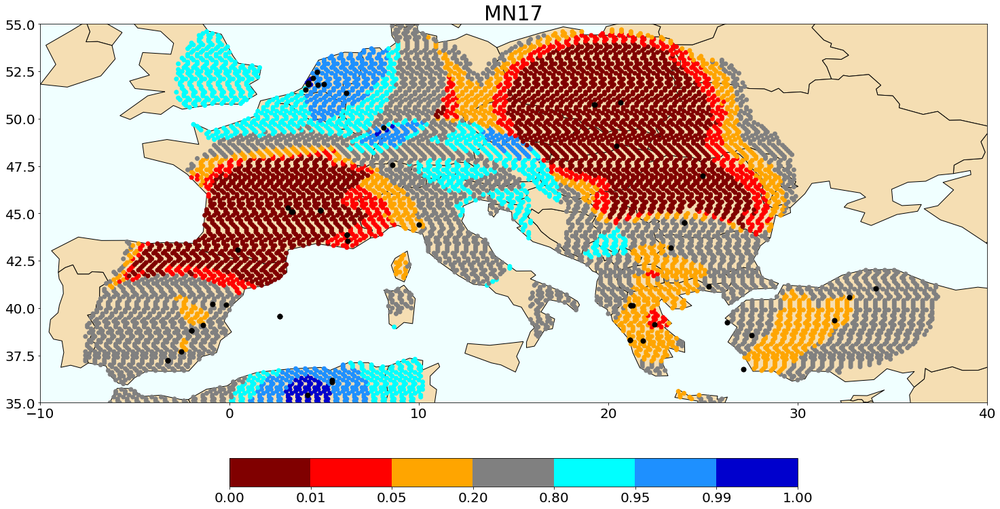

In [20]:
# let's take a closer look 
timeUnit = 'MN17'

min_occurrences = 1
        
myMap = world.cx[:,:]
cmap = matplotlib.colors.ListedColormap(['maroon','red','orange','gray','cyan','dodgerblue','mediumblue'])
norm = matplotlib.colors.BoundaryNorm([0,0.01,0.05,0.2,0.8,0.95,0.99,1],8)
fig, axs = plt.subplots(figsize=(25,15))    

#plot map    
myMap.plot(ax=axs, color='wheat', edgecolor='black')

i = timeUnits.index(timeUnit) - 1
x = gridFeaturesAll[i].loc[(gridFeaturesAll[i+1]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
                     (gridFeaturesAll[i]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences),'LONG']
y = gridFeaturesAll[i].loc[(gridFeaturesAll[i+1]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
                     (gridFeaturesAll[i]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences),'LAT']
color=gridFeaturesAll[i+1].loc[(gridFeaturesAll[i+1]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
     (gridFeaturesAll[i]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences),'SIGNIFICANCE EMIGRATION']

plt.scatter(x, y, c=color, cmap=cmap, norm=norm)

x = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnit), 'LONG']
y = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnit), 'LAT']
#size = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]),'NUMBER OF OCCURRENCES']
plt.scatter(x, y, c='black', marker='o', s=50)
#axs[yCount,xCount].scatter(x, y, marker='o', s=10*size, facecolors='none',  edgecolors='black')

axs.set_title(timeUnit, fontsize=30)
axs.set_xlim((-10,40))
axs.set_ylim((35,55))
axs.tick_params(labelsize=20)

axs.set_facecolor('azure')
    
cbar = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=axs, shrink=0.6, \
                    orientation='horizontal', pad=0.1) 
cbar.ax.tick_params(labelsize=20)

#filepath = '../figures/emigration500.eps'
#plt.savefig(filepath, bbox_inches='tight')

plt.show()

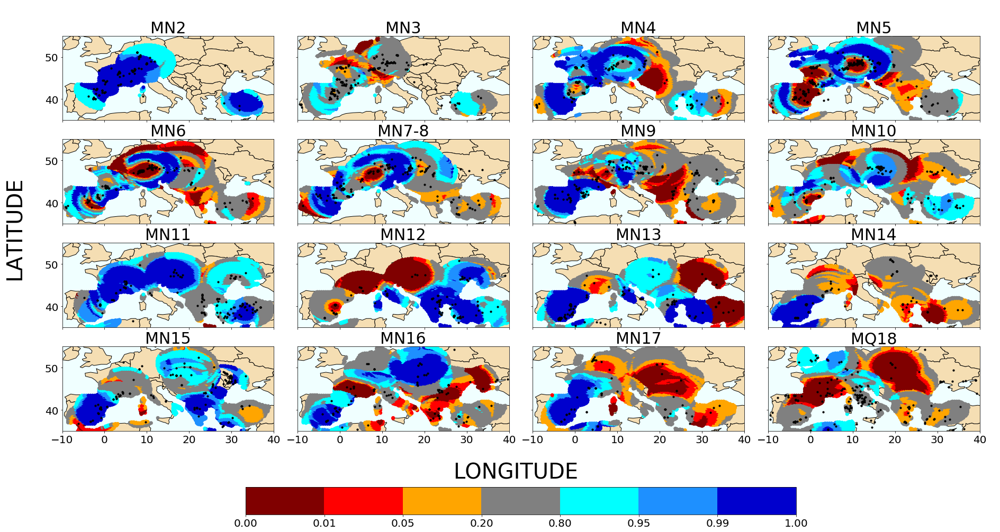

In [17]:
# EMIGRATION HEAT MAPS (alt)
# SHOWS AREAS WHERE PREVIOUSLY EXISTING SPECIES HAVE MOVED OUT
# COMPARED TO PREVIOUS, EMIGRATION IS SHIFTED ONE TIME UNIT FORWARD

min_occurrences = 1
        
myMap = world.cx[:,:]
cmap = matplotlib.colors.ListedColormap(['maroon','red','orange','gray','cyan','dodgerblue','mediumblue'])
norm = matplotlib.colors.BoundaryNorm([0,0.01,0.05,0.2,0.8,0.95,0.99,1],8)
fig, axs = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(25,15))    
    
timeCount = 2
xCount = 0
yCount = 0
for i in range(1,len(gridFeaturesAll)-1):
    #plot map    
    myMap.plot(ax=axs[yCount,xCount], color='wheat', edgecolor='black')
    
    x = gridFeaturesAll[i].loc[(gridFeaturesAll[i]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
                         (gridFeaturesAll[i-1]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences),'LONG']
    y = gridFeaturesAll[i].loc[(gridFeaturesAll[i]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
                         (gridFeaturesAll[i-1]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences),'LAT']
    color=gridFeaturesAll[i].loc[(gridFeaturesAll[i]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
         (gridFeaturesAll[i-1]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences),'SIGNIFICANCE EMIGRATION']
    
    map_set = axs[yCount,xCount].scatter(x, y, c=color, cmap=cmap, norm=norm)
    
    x = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LONG']
    y = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LAT']
    #size = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]),'NUMBER OF OCCURRENCES']
    axs[yCount,xCount].scatter(x, y, c='black', marker='o', s=10)
    #axs[yCount,xCount].scatter(x, y, marker='o', s=10*size, facecolors='none',  edgecolors='black')
    
    axs[yCount,xCount].set_title(timeUnits[timeCount], fontsize=30)
    axs[yCount,xCount].set_xlim((-10,40))
    axs[yCount,xCount].set_ylim((35,55))
    axs[yCount,xCount].tick_params(labelsize=20)
    
    axs[yCount,xCount].set_facecolor('azure')
    
    timeCount += 1
    xCount += 1
    if xCount%4 == 0:
        xCount = 0
        yCount += 1

plt.tight_layout()
    
cbar = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=axs, shrink=0.6, \
                    orientation='horizontal', pad=0.1) 
cbar.ax.tick_params(labelsize=20)

ax2 = fig.add_axes([0, 0.22, 1, 0.78], frameon=False)
ax2.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
ax2.set_xlabel('LONGITUDE', fontsize=40)
ax2.set_ylabel('LATITUDE', fontsize=40)

#filepath = '../figures/emigration500_alt.eps'
#plt.savefig(filepath, bbox_inches='tight')

plt.show()

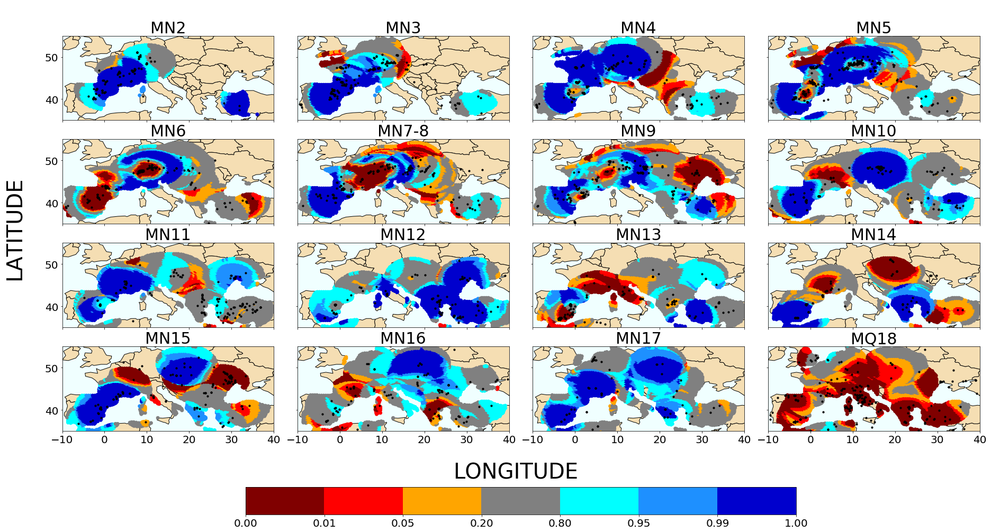

In [8]:
# IMMIGRATION HEAT MAPS

min_occurrences = 1

myMap = world.cx[:,:]
cmap = matplotlib.colors.ListedColormap(['maroon','red','orange','gray','cyan','dodgerblue','mediumblue'])
norm = matplotlib.colors.BoundaryNorm([0,0.01,0.05,0.2,0.8,0.95,0.99,1],8)
#cmap = 'RdYlBu'
#norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
fig, axs = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(25,15))    
    
timeCount = 2
xCount = 0
yCount = 0
for i in range(1,len(gridFeaturesAll)-1):
    #plot map    
    myMap.plot(ax=axs[yCount,xCount], color='wheat', edgecolor='black')    
    
    #x = gridFeatures.loc[(gridFeatures['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
    #                     (gridFeaturesAll[timeCount-2]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences),'LONG']
    #y = gridFeatures.loc[(gridFeatures['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
    #                     (gridFeaturesAll[timeCount-2]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences),'LAT']
    #color=gridFeatures.loc[(gridFeatures['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
    #     (gridFeaturesAll[timeCount-2]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences),'SIGNIFICANCE IMMIGRATION']
    
    x = gridFeaturesAll[i].loc[(gridFeaturesAll[i]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
                         (gridFeaturesAll[i-1]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences),'LONG']
    y = gridFeaturesAll[i].loc[(gridFeaturesAll[i]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
                         (gridFeaturesAll[i-1]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences),'LAT']
    color=gridFeaturesAll[i].loc[(gridFeaturesAll[i]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
         (gridFeaturesAll[i-1]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences),'SIGNIFICANCE IMMIGRATION']
    
    map_set = axs[yCount,xCount].scatter(x, y, c=color, cmap=cmap, norm=norm)
    
    x = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LONG']
    y = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LAT']    
    axs[yCount,xCount].scatter(x, y, c='black', marker='o', s=10)
    
    axs[yCount,xCount].set_title(timeUnits[timeCount], fontsize=30)
    axs[yCount,xCount].set_xlim((-10,40))
    axs[yCount,xCount].set_ylim((35,55))
    axs[yCount,xCount].tick_params(labelsize=20)
    
    axs[yCount,xCount].set_facecolor('azure')
    
    timeCount += 1
    xCount += 1
    if xCount%4 == 0:
        xCount = 0
        yCount += 1

plt.tight_layout()
    
cbar = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=axs, shrink=0.6, \
                    orientation='horizontal', pad=0.1) 
cbar.ax.tick_params(labelsize=20)

ax2 = fig.add_axes([0, 0.22, 1, 0.78], frameon=False)
ax2.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
ax2.set_xlabel('LONGITUDE', fontsize=40)
ax2.set_ylabel('LATITUDE', fontsize=40)

#filepath = '../figures/immigration500.eps'
#plt.savefig(filepath, bbox_inches='tight')

plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


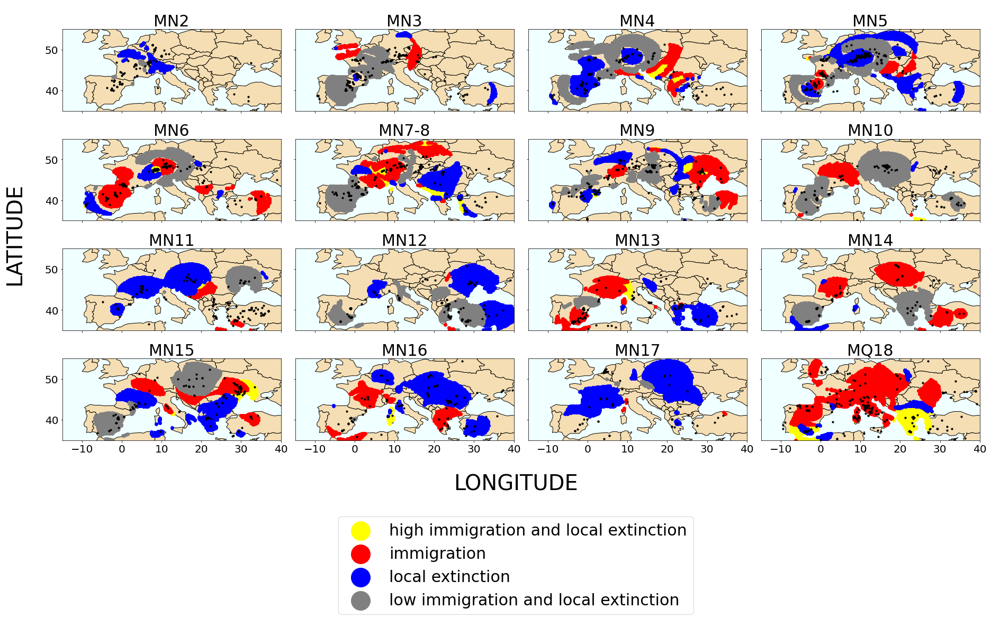

In [36]:
# MIGRATION HOTSPOTS

min_occurrences = 1

myMap = world.cx[:,:]
fig, axs = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(25,12))

timeCount = 2
xCount = 0
yCount = 0
for i in range(1,len(gridFeaturesAll)-1):
    myMap.plot(ax=axs[yCount,xCount], color='wheat', edgecolor='black')
    
    x = gridFeaturesAll[i].loc[(gridFeaturesAll[i-1]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences) & \
             (gridFeaturesAll[i]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
             (gridFeaturesAll[i]['SIGNIFICANCE IMMIGRATION']<0.05) & \
             (gridFeaturesAll[i]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences) & \
             (gridFeaturesAll[i+1]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
             (gridFeaturesAll[i+1]['SIGNIFICANCE EMIGRATION']<0.05),'LONG']
    y = gridFeaturesAll[i].loc[(gridFeaturesAll[i-1]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences) & \
             (gridFeaturesAll[i]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
             (gridFeaturesAll[i]['SIGNIFICANCE IMMIGRATION']<0.05) & \
             (gridFeaturesAll[i]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences) & \
             (gridFeaturesAll[i+1]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
             (gridFeaturesAll[i+1]['SIGNIFICANCE EMIGRATION']<0.05),'LAT']
    axs[yCount,xCount].scatter(x, y, c='yellow', label='high immigration and local extinction')
    
    x = gridFeaturesAll[i].loc[(gridFeaturesAll[i-1]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences) & \
             (gridFeaturesAll[i]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
             (gridFeaturesAll[i]['SIGNIFICANCE IMMIGRATION']<0.05) & \
             (gridFeaturesAll[i]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences) & \
             (gridFeaturesAll[i+1]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
             (gridFeaturesAll[i+1]['SIGNIFICANCE EMIGRATION']>=0.05),'LONG']
    y = gridFeaturesAll[i].loc[(gridFeaturesAll[i-1]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences) & \
             (gridFeaturesAll[i]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
             (gridFeaturesAll[i]['SIGNIFICANCE IMMIGRATION']<0.05) & \
             (gridFeaturesAll[i]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences) & \
             (gridFeaturesAll[i+1]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
             (gridFeaturesAll[i+1]['SIGNIFICANCE EMIGRATION']>=0.05),'LAT']
    axs[yCount,xCount].scatter(x, y, c='red', label='immigration')
    
    x = gridFeaturesAll[i].loc[(gridFeaturesAll[i-1]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences) & \
             (gridFeaturesAll[i]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
             (gridFeaturesAll[i]['SIGNIFICANCE IMMIGRATION']>=0.05) & \
             (gridFeaturesAll[i]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences) & \
             (gridFeaturesAll[i+1]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
             (gridFeaturesAll[i+1]['SIGNIFICANCE EMIGRATION']<0.05),'LONG']
    y = gridFeaturesAll[i].loc[(gridFeaturesAll[i-1]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences) & \
             (gridFeaturesAll[i]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
             (gridFeaturesAll[i]['SIGNIFICANCE IMMIGRATION']>=0.05) & \
             (gridFeaturesAll[i]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences) & \
             (gridFeaturesAll[i+1]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
             (gridFeaturesAll[i+1]['SIGNIFICANCE EMIGRATION']<0.05),'LAT']
    axs[yCount,xCount].scatter(x, y, c='blue', label='local extinction')
    
    x = gridFeaturesAll[i].loc[(gridFeaturesAll[i-1]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences) & \
             (gridFeaturesAll[i]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
             (gridFeaturesAll[i]['SIGNIFICANCE IMMIGRATION']>0.95) & \
             (gridFeaturesAll[i]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences) & \
             (gridFeaturesAll[i+1]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
             (gridFeaturesAll[i+1]['SIGNIFICANCE EMIGRATION']>0.95),'LONG']
    y = gridFeaturesAll[i].loc[(gridFeaturesAll[i-1]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences) & \
             (gridFeaturesAll[i]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
             (gridFeaturesAll[i]['SIGNIFICANCE IMMIGRATION']>0.95) & \
             (gridFeaturesAll[i]['OCCURRENCES WITHOUT EXTINCTION']>min_occurrences) & \
             (gridFeaturesAll[i+1]['OCCURRENCES WITHOUT SPECIATION']>min_occurrences) & \
             (gridFeaturesAll[i+1]['SIGNIFICANCE EMIGRATION']>0.95),'LAT']
    axs[yCount,xCount].scatter(x, y, c='gray', label='low immigration and local extinction')
        
    axs[yCount,xCount].set_title(timeUnits[timeCount], fontsize=30)
    axs[yCount,xCount].set_xlim((-15,40))
    axs[yCount,xCount].set_ylim((35,55))
    axs[yCount,xCount].tick_params(labelsize=20)
    
    x = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LONG']
    y = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LAT']
    axs[yCount,xCount].scatter(x, y, c='black', marker='o', s=10)
    
    axs[yCount,xCount].set_facecolor('azure')
    handles, labels = axs[yCount,xCount].get_legend_handles_labels()
    
    timeCount += 1
    xCount += 1
    if xCount%4 == 0:
        xCount = 0
        yCount += 1

plt.tight_layout()
fig.legend(handles, labels, loc='lower center', fontsize=30, bbox_to_anchor=(0., -0.35, 1, 1), markerscale=6)

ax2 = fig.add_axes([0, 0, 1, 1], frameon=False)
ax2.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
ax2.set_xlabel('LONGITUDE', fontsize=40)
ax2.set_ylabel('LATITUDE', fontsize=40)

#filepath = '../figures/migration500.eps'
#plt.savefig(filepath, bbox_inches='tight')

plt.show()

In [4]:
for gridFeatures in gridFeaturesAll:
    npp_max = []
    npp_min = []
    npp_max.append(gridFeatures['NPP'].max())
    npp_min.append(gridFeatures['NPP'].min())
    
print('NPP max: ' + str(np.max(npp_max)))
print('NPP min: ' + str(np.min(npp_min)))

NPP max: 2653.5
NPP min: 109.65000000000008


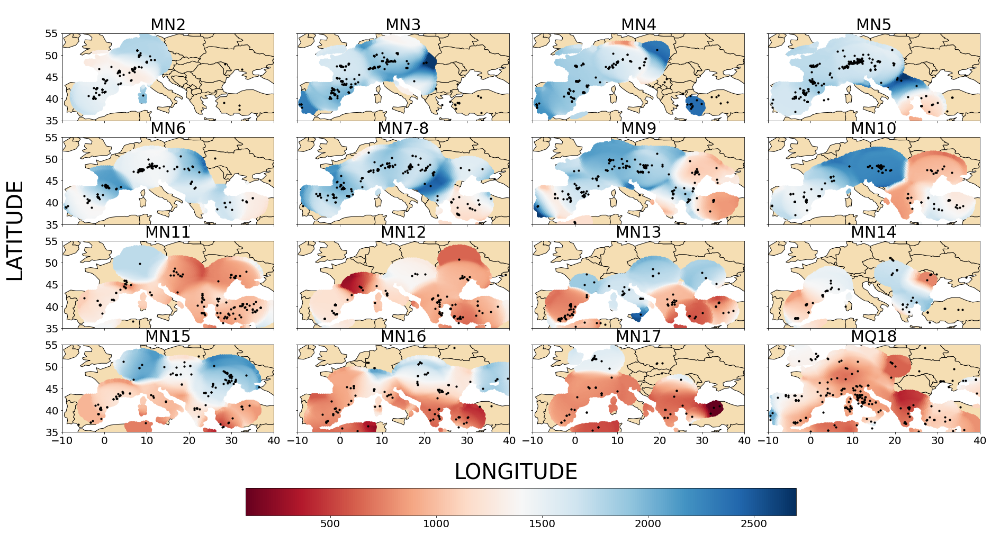

In [10]:
# NPP 

min_occurrences = 2

myMap = world.cx[:,:]
#cmap = 'RdYlGn'
cmap = 'RdBu'
norm = matplotlib.colors.Normalize(vmin=100, vmax=2700)
fig, axs = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(25,15))

timeCount = 2
xCount = 0
yCount = 0
for gridFeatures in gridFeaturesAll[1:-1]:
    #plot map    
    myMap.plot(ax=axs[yCount,xCount], color='wheat', edgecolor='black')
    
    x = gridFeatures.loc[(gridFeatures.loc[:,'HYP1':'HYP3'].sum(axis=1)>min_occurrences) | \
                         (gridFeatures.loc[:,'LOP0':'LOP2'].sum(axis=1)>min_occurrences),'LONG']
    y = gridFeatures.loc[(gridFeatures.loc[:,'HYP1':'HYP3'].sum(axis=1)>min_occurrences) | \
                         (gridFeatures.loc[:,'LOP0':'LOP2'].sum(axis=1)>min_occurrences),'LAT']        
    color = gridFeatures.loc[(gridFeatures.loc[:,'HYP1':'HYP3'].sum(axis=1)>min_occurrences) | \
                         (gridFeatures.loc[:,'LOP0':'LOP2'].sum(axis=1)>min_occurrences),'NPP']
    axs[yCount,xCount].scatter(x, y, c=color, cmap=cmap, norm=norm)
        
    x = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LONG']
    y = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LAT']
    axs[yCount,xCount].scatter(x, y, c='black', marker='o', s=10)
    
    axs[yCount,xCount].set_title(timeUnits[timeCount], fontsize=30)
    axs[yCount,xCount].set_xlim((-10,40))
    axs[yCount,xCount].set_ylim((35,55))
    axs[yCount,xCount].tick_params(labelsize=20)
    
    timeCount += 1
    xCount += 1
    if xCount%4 == 0:
        xCount = 0
        yCount += 1

plt.tight_layout()

cbar = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=axs, shrink=0.6, \
                    orientation='horizontal', pad=0.1)    
cbar.ax.tick_params(labelsize=20)

ax2 = fig.add_axes([0, 0.22, 1, 0.78], frameon=False)
ax2.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
ax2.set_xlabel('LONGITUDE', fontsize=40)
ax2.set_ylabel('LATITUDE', fontsize=40)

#filepath = '../figures/npp500.eps'
#plt.savefig(filepath, bbox_inches='tight')

plt.show()

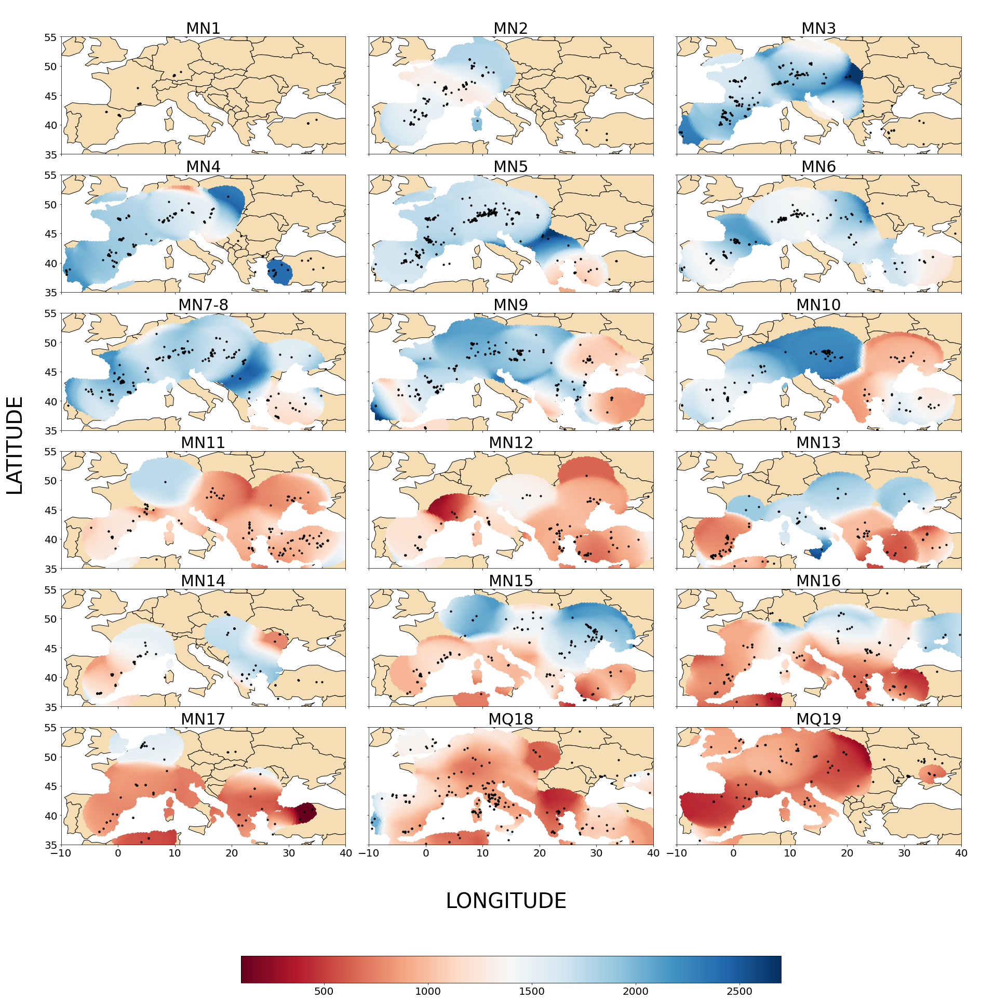

In [8]:
# NPP 

min_occurrences = 2

myMap = world.cx[:,:]
#cmap = 'RdYlGn'
cmap = 'RdBu'
norm = matplotlib.colors.Normalize(vmin=100, vmax=2700)
fig, axs = plt.subplots(6, 3, sharex=True, sharey=True, figsize=(25,30))

timeCount = 1
xCount = 0
yCount = 0
for gridFeatures in gridFeaturesAll:
    #plot map    
    myMap.plot(ax=axs[yCount,xCount], color='wheat', edgecolor='black')
    
    x = gridFeatures.loc[(gridFeatures.loc[:,'HYP1':'HYP3'].sum(axis=1)>min_occurrences) | \
                         (gridFeatures.loc[:,'LOP0':'LOP2'].sum(axis=1)>min_occurrences),'LONG']
    y = gridFeatures.loc[(gridFeatures.loc[:,'HYP1':'HYP3'].sum(axis=1)>min_occurrences) | \
                         (gridFeatures.loc[:,'LOP0':'LOP2'].sum(axis=1)>min_occurrences),'LAT']        
    color = gridFeatures.loc[(gridFeatures.loc[:,'HYP1':'HYP3'].sum(axis=1)>min_occurrences) | \
                         (gridFeatures.loc[:,'LOP0':'LOP2'].sum(axis=1)>min_occurrences),'NPP']
    axs[yCount,xCount].scatter(x, y, c=color, cmap=cmap, norm=norm)
        
    x = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LONG']
    y = localityFeatures.loc[(localityFeatures['TIMEUNIT']==timeUnits[timeCount]), 'LAT']
    axs[yCount,xCount].scatter(x, y, c='black', marker='o', s=10)
    
    axs[yCount,xCount].set_title(timeUnits[timeCount], fontsize=30)
    axs[yCount,xCount].set_xlim((-10,40))
    axs[yCount,xCount].set_ylim((35,55))
    axs[yCount,xCount].tick_params(labelsize=20)
    
    timeCount += 1
    xCount += 1
    if xCount%3 == 0:
        xCount = 0
        yCount += 1

plt.tight_layout()

cbar = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=axs, shrink=0.6, \
                    orientation='horizontal', pad=0.1)    
cbar.ax.tick_params(labelsize=20)

ax2 = fig.add_axes([0, 0.22, 1, 0.78], frameon=False)
ax2.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
ax2.set_xlabel('LONGITUDE', fontsize=40)
ax2.set_ylabel('LATITUDE', fontsize=40)

#filepath = '../figures/npp500_redblue.eps'
#plt.savefig(filepath, bbox_inches='tight')

plt.show()